# Classificação de imagens

A classificação de imagens é uma das tarefas mais "tradicionais" de IAs.

Dada uma imagem, o modelo de IA deve classificá-la entre algumas categorias, como:
- Cachorro ou gato
- Comida: pizza, batata-frita ou hot-dog
- Cômodos: X, Y ou Z

Vamos ver como realizar classificação com os modelos do Hugging Face. Para isso, vamos usar este dataset: https://huggingface.co/datasets/Bingsu/Cat_and_Dog

In [4]:
from datasets import load_dataset

dados = load_dataset('Bingsu/Cat_and_Dog', split='test')

linhas = dados.shuffle()[:10]

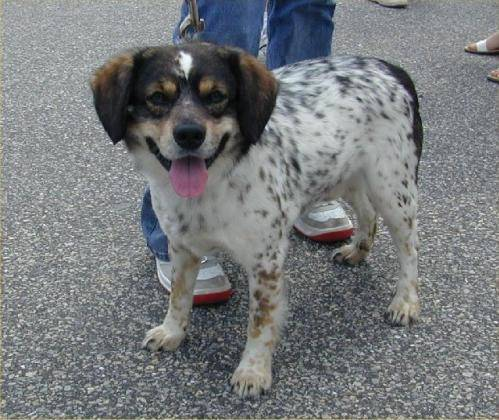

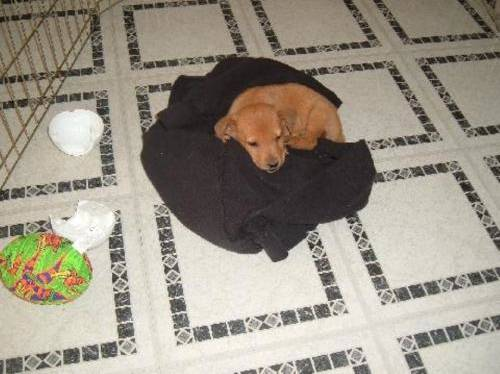

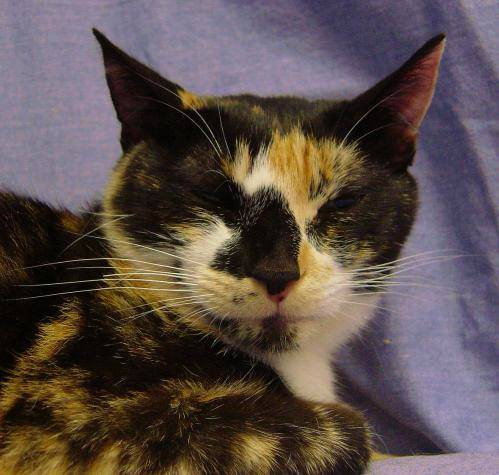

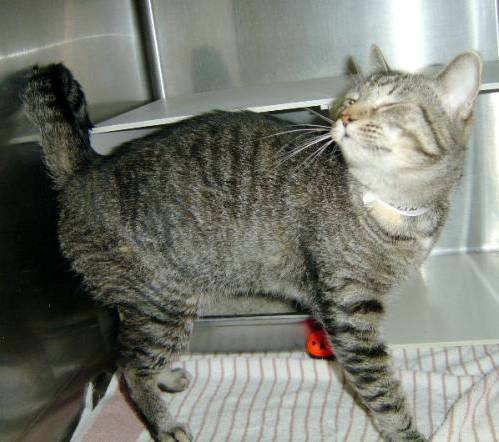

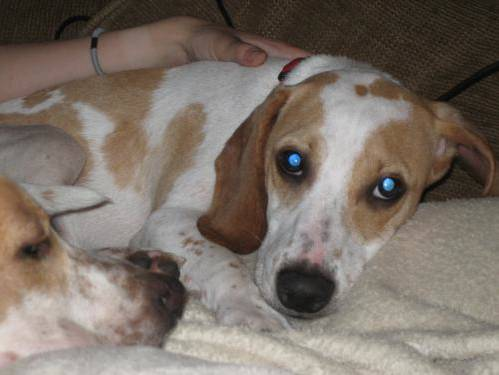

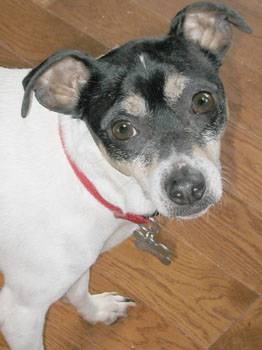

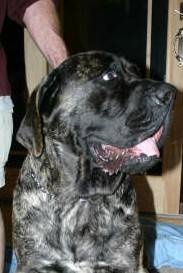

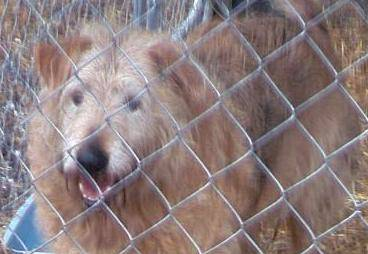

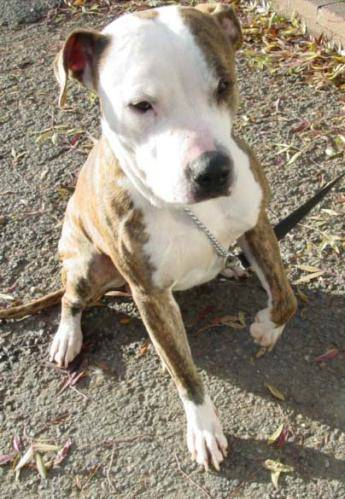

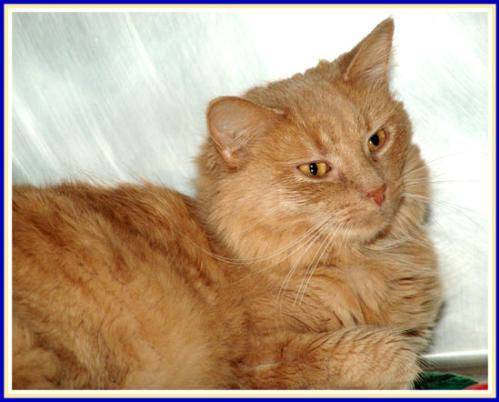

In [5]:
for imagem in linhas['image']:
    display(imagem)

Vamos criar uma função auxiliar para exibir as fotos em tamanho menor (sem modificá-las no dataset!)

In [6]:
# Função auxiliar

def mostrar_imagem(imagem):
    imagem = imagem.copy()
    imagem.thumbnail((250, 250))
    display(imagem)

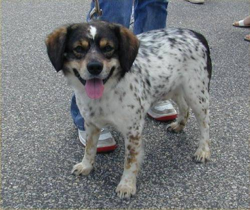

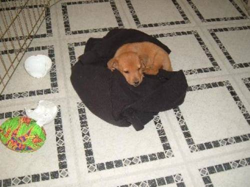

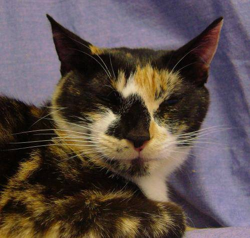

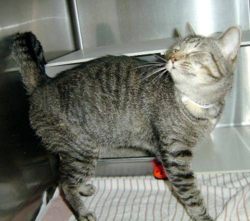

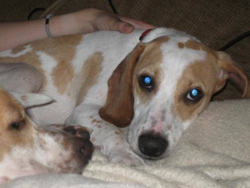

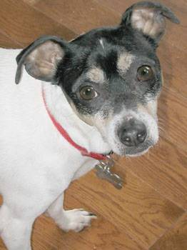

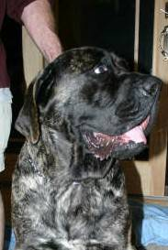

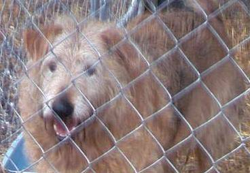

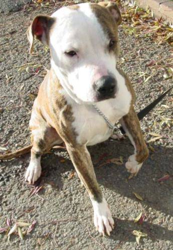

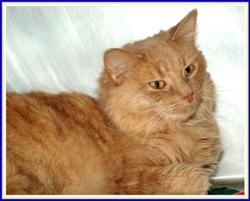

In [7]:
for imagem in linhas['image']:
    mostrar_imagem(imagem)

## Modelo de classificação

Vamos usar este modelo treinado para classificar cachorros e gatos: https://huggingface.co/akahana/vit-base-cats-vs-dogs

In [31]:
from transformers import pipeline

modelo = "akahana/vit-base-cats-vs-dogs"
classificador = pipeline('image-classification', model=modelo)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


[{'label': 'dog', 'score': 0.9986135959625244}, {'label': 'cat', 'score': 0.001386352232657373}]


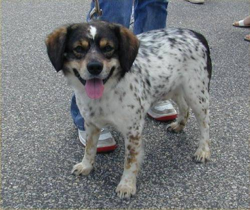

[{'label': 'dog', 'score': 0.9884053468704224}, {'label': 'cat', 'score': 0.011594689451158047}]


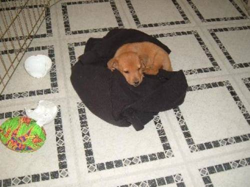

[{'label': 'cat', 'score': 0.9988692402839661}, {'label': 'dog', 'score': 0.001130716409534216}]


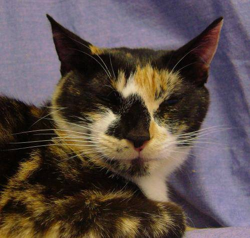

[{'label': 'cat', 'score': 0.9987813830375671}, {'label': 'dog', 'score': 0.0012186284875497222}]


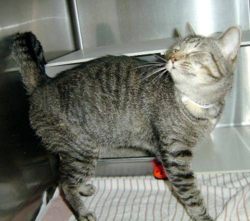

[{'label': 'dog', 'score': 0.9985900521278381}, {'label': 'cat', 'score': 0.0014099548570811749}]


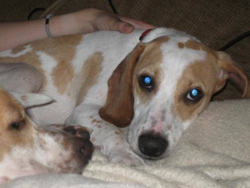

[{'label': 'dog', 'score': 0.9986538887023926}, {'label': 'cat', 'score': 0.0013460884802043438}]


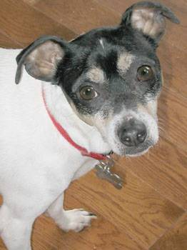

[{'label': 'dog', 'score': 0.9986031651496887}, {'label': 'cat', 'score': 0.0013968109851703048}]


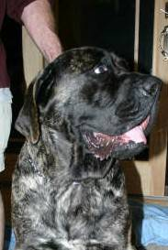

[{'label': 'dog', 'score': 0.9984720349311829}, {'label': 'cat', 'score': 0.0015278966166079044}]


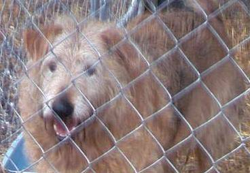

[{'label': 'dog', 'score': 0.998619794845581}, {'label': 'cat', 'score': 0.0013801922323182225}]


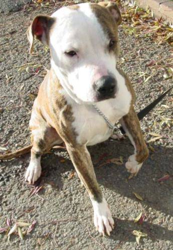

[{'label': 'cat', 'score': 0.9986764788627625}, {'label': 'dog', 'score': 0.0013235171791166067}]


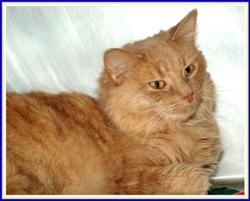

In [32]:
for imagem in linhas['image']:
    predicao = classificador(imagem)
    print(predicao)
    mostrar_imagem(imagem)

Vamos testá-lo com uma imagens fora do Dataset:

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=900x1600 at 0x71C995719C10>


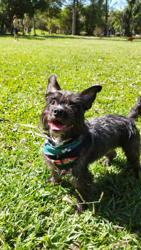

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=960x1280 at 0x71C991980150>


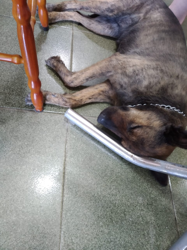

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=720x1280 at 0x71C9919803D0>


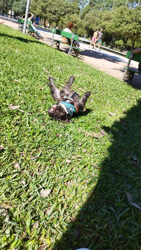

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=960x1280 at 0x71C992E07990>


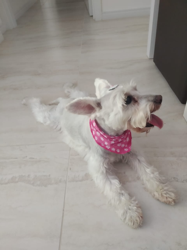

In [37]:
from pathlib import Path
from PIL import Image

dog_images = [Image.open(arquivo) for arquivo in Path('imagens/dogs').iterdir()]
for imagem in dog_images:
    print(imagem)
    mostrar_imagem(imagem)

[{'label': 'dog', 'score': 0.9974910020828247}, {'label': 'cat', 'score': 0.002508997917175293}]


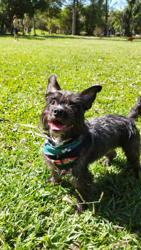

[{'label': 'dog', 'score': 0.9734756350517273}, {'label': 'cat', 'score': 0.02652435377240181}]


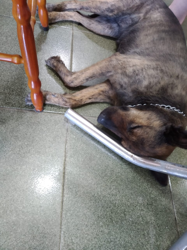

[{'label': 'dog', 'score': 0.9834120273590088}, {'label': 'cat', 'score': 0.016587959602475166}]


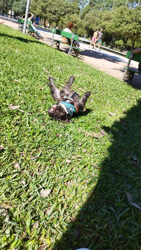

[{'label': 'dog', 'score': 0.9983647465705872}, {'label': 'cat', 'score': 0.001635278225876391}]


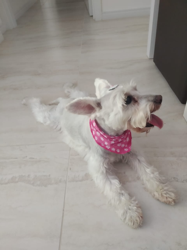

In [38]:
for imagem in dog_images:
    predicao = classificador(imagem)
    print(predicao)
    mostrar_imagem(imagem)

E por fim, desafiá-lo com imagens que não são de cachorros ou gatos:

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=275x183 at 0x71C991C5A110>


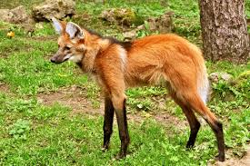

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=5026x3351 at 0x71C992DD2E50>


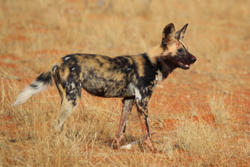

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=232x218 at 0x71C9910A3350>


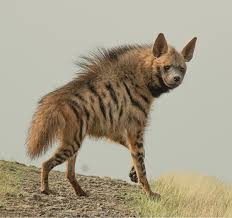

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x427 at 0x71C9910A2AD0>


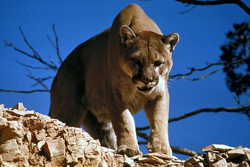

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=221x228 at 0x71C9910A2850>


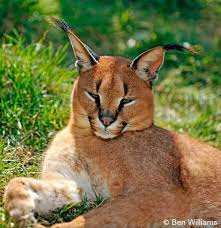

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x662 at 0x71C9911DB690>


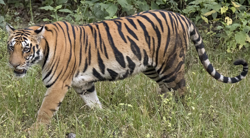

In [42]:
from pathlib import Path

from PIL import Image

animais = [Image.open(arquivo) for arquivo in Path('imagens/animals').iterdir()]
for imagem in animais:
    print(imagem)
    mostrar_imagem(imagem)

[{'label': 'dog', 'score': 0.9979662895202637}, {'label': 'cat', 'score': 0.0020336920861154795}]


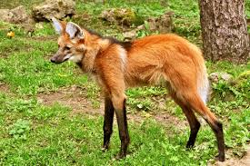

[{'label': 'dog', 'score': 0.9974881410598755}, {'label': 'cat', 'score': 0.00251190597191453}]


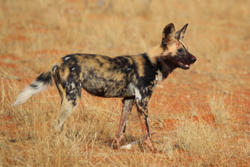

[{'label': 'dog', 'score': 0.9908221960067749}, {'label': 'cat', 'score': 0.009177818894386292}]


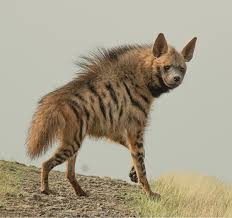

[{'label': 'dog', 'score': 0.9981684684753418}, {'label': 'cat', 'score': 0.001831532921642065}]


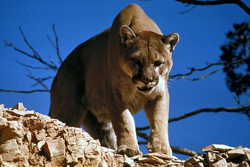

[{'label': 'dog', 'score': 0.9175581336021423}, {'label': 'cat', 'score': 0.08244192600250244}]


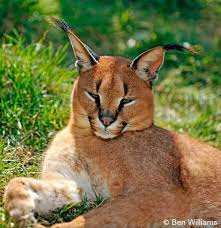

[{'label': 'dog', 'score': 0.9954427480697632}, {'label': 'cat', 'score': 0.00455724261701107}]


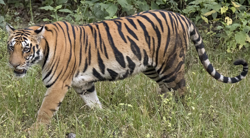

In [43]:
for imagem in animais:
    predicao = classificador(imagem)
    print(predicao)
    mostrar_imagem(imagem)

## Testando outros modelos

Classificador de comida: https://huggingface.co/nateraw/food

In [18]:
modelo = "nateraw/food"
classificador = pipeline('image-classification', model=modelo)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


In [19]:
from pathlib import Path

caminho_imagens_comida = sorted(Path('imagens/comidas').glob('*.jpg'))
print(caminho_imagens_comida)

[PosixPath('imagens/comidas/batata_frita.jpg'), PosixPath('imagens/comidas/cafe.jpg'), PosixPath('imagens/comidas/file.jpg'), PosixPath('imagens/comidas/pizza.jpg'), PosixPath('imagens/comidas/salada.jpg'), PosixPath('imagens/comidas/suco.jpg')]


In [20]:
from PIL import Image

imagens = [Image.open(caminho) for caminho in caminho_imagens_comida]
imagens

[<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1095x675>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=259x194>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=986x657>,
 <PIL.WebPImagePlugin.WebPImageFile image mode=RGB size=984x615>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x450>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=888x592>]

[{'label': 'french_fries', 'score': 0.9961793422698975}, {'label': 'poutine', 'score': 0.00021627516252920032}, {'label': 'onion_rings', 'score': 0.00018582628399599344}, {'label': 'hamburger', 'score': 0.00016602090909145772}, {'label': 'fish_and_chips', 'score': 9.228337148670107e-05}]


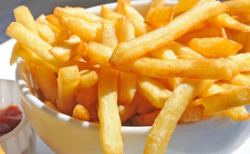

[{'label': 'churros', 'score': 0.14318181574344635}, {'label': 'hot_and_sour_soup', 'score': 0.12699070572853088}, {'label': 'french_onion_soup', 'score': 0.06101815775036812}, {'label': 'panna_cotta', 'score': 0.05992995202541351}, {'label': 'miso_soup', 'score': 0.04499143734574318}]


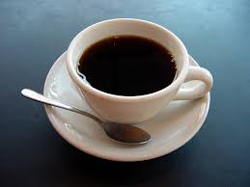

[{'label': 'filet_mignon', 'score': 0.9797660708427429}, {'label': 'steak', 'score': 0.005324850790202618}, {'label': 'prime_rib', 'score': 0.0004503084346652031}, {'label': 'beef_carpaccio', 'score': 0.00040969139081425965}, {'label': 'beef_tartare', 'score': 0.00036999364965595305}]


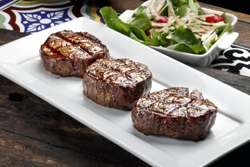

[{'label': 'pizza', 'score': 0.9971049427986145}, {'label': 'garlic_bread', 'score': 0.00014898106746841222}, {'label': 'bruschetta', 'score': 0.00012803738354705274}, {'label': 'omelette', 'score': 8.780432108324021e-05}, {'label': 'beef_carpaccio', 'score': 7.792924589011818e-05}]


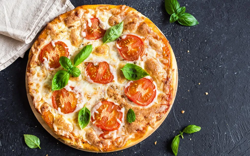

[{'label': 'greek_salad', 'score': 0.9915577173233032}, {'label': 'caprese_salad', 'score': 0.001385434647090733}, {'label': 'caesar_salad', 'score': 0.00100891781039536}, {'label': 'beet_salad', 'score': 0.0005722731002606452}, {'label': 'seaweed_salad', 'score': 0.00023629657516721636}]


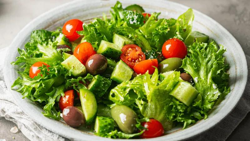

[{'label': 'pizza', 'score': 0.087684765458107}, {'label': 'omelette', 'score': 0.03640264645218849}, {'label': 'cheesecake', 'score': 0.026002125814557076}, {'label': 'apple_pie', 'score': 0.024814829230308533}, {'label': 'beignets', 'score': 0.02400505729019642}]


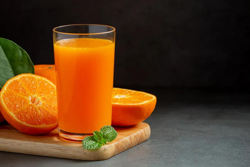

In [21]:
for imagem in imagens:
    predicao = classificador(imagem)
    print(predicao)
    mostrar_imagem(imagem)

Predição french_fries com certeza 99.62%


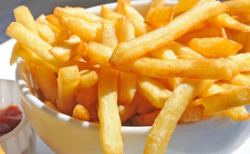

Modelo não foi capaz de predizer a comida com um nível de certeza aceitável! (14.32%)


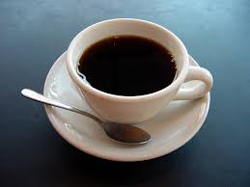

Predição filet_mignon com certeza 97.98%


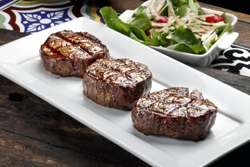

Predição pizza com certeza 99.71%


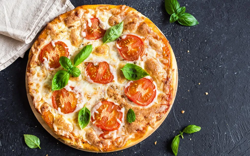

Predição greek_salad com certeza 99.16%


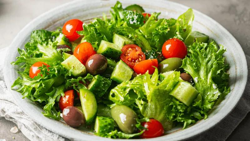

Modelo não foi capaz de predizer a comida com um nível de certeza aceitável! (8.77%)


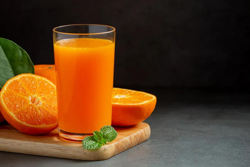

In [22]:
THRESHOLD = 0.5

for imagem in imagens:
    predicao = classificador(imagem)
    melhor_predicao = predicao[0]
    comida = melhor_predicao['label']
    score = melhor_predicao['score']
    score_formatado = f'{score * 100:.2f}%'
    if score < THRESHOLD:
        print(f'Modelo não foi capaz de predizer a comida com um nível de certeza aceitável! ({score_formatado})')
    else:
        print(f'Predição {comida} com certeza {score_formatado}')
    mostrar_imagem(imagem)

Classificador de ambientes e imóveis: https://huggingface.co/andupets/real-estate-image-classification

In [26]:
modelo = "andupets/real-estate-image-classification"
classificador = pipeline('image-classification', model=modelo)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


[{'label': 'bathroom', 'score': 0.6870370507240295}, {'label': 'kitchen', 'score': 0.15960374474525452}, {'label': 'bedroom', 'score': 0.03889743238687515}, {'label': 'house facade', 'score': 0.029679900035262108}, {'label': 'sao paulo apartment facade', 'score': 0.029548363760113716}]


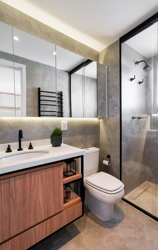

[{'label': 'bathroom', 'score': 0.8219111561775208}, {'label': 'kitchen', 'score': 0.037573326379060745}, {'label': 'dining room', 'score': 0.03202331066131592}, {'label': 'bedroom', 'score': 0.03172893449664116}, {'label': 'house facade', 'score': 0.026454905048012733}]


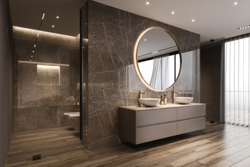

[{'label': 'house facade', 'score': 0.7678813338279724}, {'label': 'sao paulo apartment facade', 'score': 0.05554690212011337}, {'label': 'living room', 'score': 0.041121695190668106}, {'label': 'dining room', 'score': 0.03887078911066055}, {'label': 'bathroom', 'score': 0.03709256649017334}]


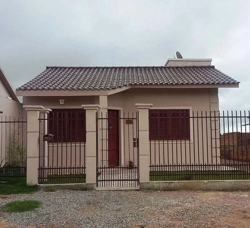

[{'label': 'kitchen', 'score': 0.7557634115219116}, {'label': 'bathroom', 'score': 0.064302958548069}, {'label': 'dining room', 'score': 0.0620453804731369}, {'label': 'living room', 'score': 0.034082863479852676}, {'label': 'house facade', 'score': 0.03035172075033188}]


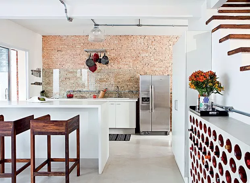

[{'label': 'house facade', 'score': 0.799547553062439}, {'label': 'sao paulo apartment facade', 'score': 0.04894591122865677}, {'label': 'dining room', 'score': 0.03538890928030014}, {'label': 'living room', 'score': 0.034479741007089615}, {'label': 'bathroom', 'score': 0.02884296514093876}]


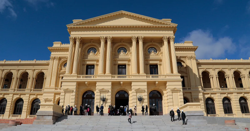

[{'label': 'dining room', 'score': 0.38628673553466797}, {'label': 'living room', 'score': 0.38556528091430664}, {'label': 'house facade', 'score': 0.08246856182813644}, {'label': 'kitchen', 'score': 0.043192822486162186}, {'label': 'sao paulo apartment facade', 'score': 0.04100225493311882}]


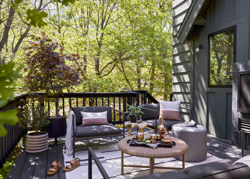

[{'label': 'sao paulo apartment facade', 'score': 0.7076331973075867}, {'label': 'house facade', 'score': 0.0946110412478447}, {'label': 'bathroom', 'score': 0.044313088059425354}, {'label': 'bedroom', 'score': 0.04165792465209961}, {'label': 'kitchen', 'score': 0.03918834403157234}]


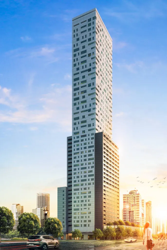

[{'label': 'house facade', 'score': 0.5954424738883972}, {'label': 'sao paulo apartment facade', 'score': 0.2375103086233139}, {'label': 'dining room', 'score': 0.03606205806136131}, {'label': 'kitchen', 'score': 0.0353446826338768}, {'label': 'bathroom', 'score': 0.03217025473713875}]


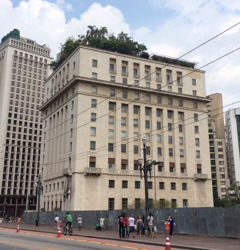

[{'label': 'living room', 'score': 0.7395702600479126}, {'label': 'dining room', 'score': 0.10728468745946884}, {'label': 'bedroom', 'score': 0.03905372694134712}, {'label': 'kitchen', 'score': 0.03606036677956581}, {'label': 'bathroom', 'score': 0.032913293689489365}]


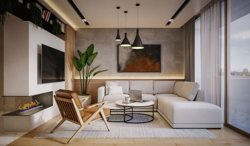

[{'label': 'living room', 'score': 0.6341990828514099}, {'label': 'kitchen', 'score': 0.1095820888876915}, {'label': 'dining room', 'score': 0.06879884749650955}, {'label': 'bedroom', 'score': 0.0648423582315445}, {'label': 'bathroom', 'score': 0.043718371540308}]


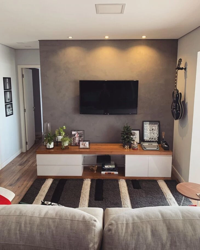

[{'label': 'living room', 'score': 0.6854459643363953}, {'label': 'bedroom', 'score': 0.10726499557495117}, {'label': 'dining room', 'score': 0.051427148282527924}, {'label': 'kitchen', 'score': 0.0463569276034832}, {'label': 'bathroom', 'score': 0.045693978667259216}]


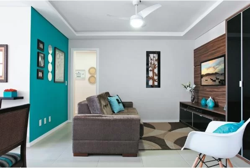

In [27]:
caminho_imagens = sorted(Path('imagens/casas').glob('*.jpg'))
imagens = [Image.open(caminho) for caminho in caminho_imagens]

for imagem in imagens:
    predicao = classificador(imagem)
    print(predicao)
    mostrar_imagem(imagem)

Predição bathroom com certeza 68.70%


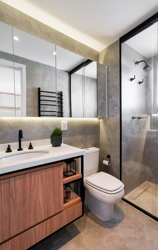

Predição bathroom com certeza 82.19%


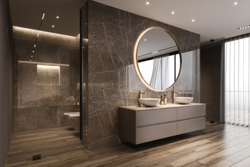

Predição house facade com certeza 76.79%


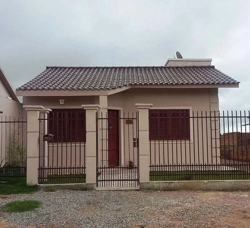

Predição kitchen com certeza 75.58%


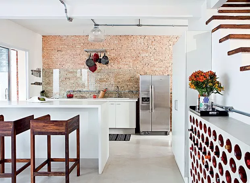

Predição house facade com certeza 79.95%


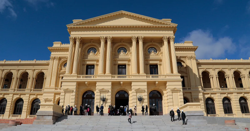

Modelo não foi capaz de predizer o ambiente com um nível de certeza aceitável! (38.63%)


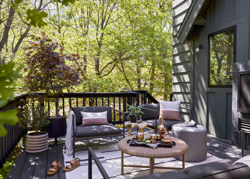

Predição sao paulo apartment facade com certeza 70.76%


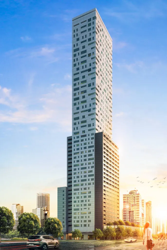

Predição house facade com certeza 59.54%


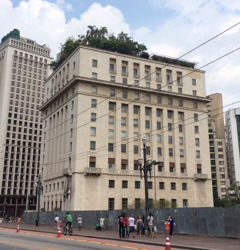

Predição living room com certeza 73.96%


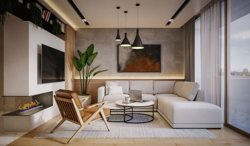

Predição living room com certeza 63.42%


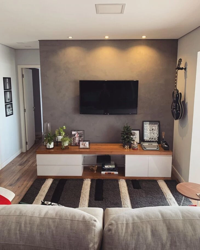

Predição living room com certeza 68.54%


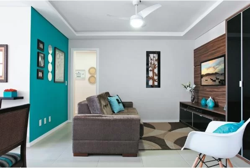

In [28]:
THRESHOLD = 0.5

for imagem in imagens:
    predicao = classificador(imagem)
    melhor_predicao = predicao[0]
    ambiente = melhor_predicao['label']
    score = melhor_predicao['score']
    score_formatado = f'{(score * 100):.2f}%'
    if score < THRESHOLD:
        print(f'Modelo não foi capaz de predizer o ambiente com um nível de certeza aceitável! ({score_formatado})')
    else:
        print(f'Predição {ambiente} com certeza {score_formatado}')
    mostrar_imagem(imagem)